In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import random
from PIL import Image
from matplotlib import pyplot as plt
import xml.etree.ElementTree as ET

import torch
import torchvision

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory
import os
#from google.colab import drive
#drive.mount('/content/drive')

# Any results you write to the current directory are saved as output.

In [2]:
os.chdir('/Users/USER/OneDrive/桌面/testing_bmd') #切換該目錄
os.listdir() #確認目錄內容

['image', 'label']

In [3]:
from PIL import Image
import numpy as np
import os

def data_statistic(image_dir, xml_dir):
    images = []
    labels = []

    for img_file in os.listdir(image_dir):
        if img_file.endswith('.png'):
            img_path = os.path.join(image_dir, img_file)
            label_file = img_file.replace('.png', '.xml')
            label_path = os.path.join(xml_dir, label_file)

            image = Image.open(img_path)
            image = image.resize((256, 256))
            images.append(np.array(image))

            labels.append(label_path)

    return images, labels

# 载入数据集
image_dir = '/Users/USER/OneDrive/桌面/testing_bmd/image'
xml_dir = '/Users/USER/OneDrive/桌面/testing_bmd/label'

images, labels = data_statistic(image_dir, xml_dir)


In [4]:
images = os.listdir(image_dir)
print("Number of Images: ", len(images))

Number of Images:  303


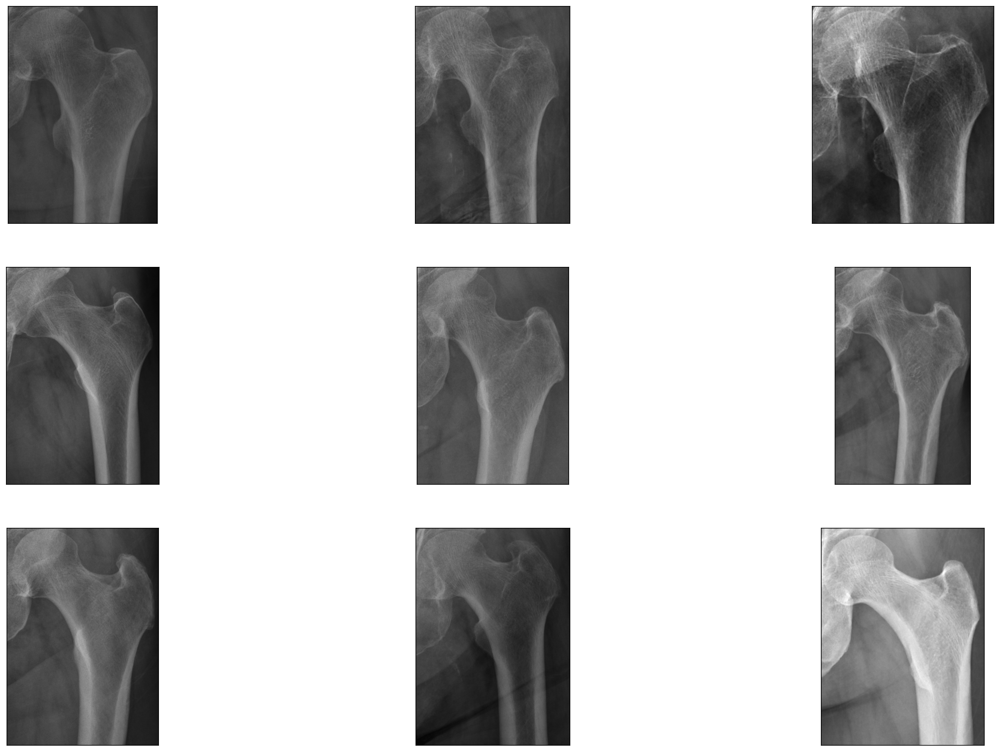

In [5]:
images_to_display = random.choices(images, k=9)

fig = plt.figure(figsize=(25, 16))
for ii, img in enumerate(images_to_display):
    ax = fig.add_subplot(3, 3, ii + 1, xticks=[], yticks=[])

    img = Image.open(os.path.join(image_dir, img))
    plt.imshow(img)

In [6]:
from torch.utils.data import Dataset
from PIL import Image
import xml.etree.ElementTree as ET
from torchvision.transforms import ToTensor
import os
import torch

class CustomDataset(Dataset):
    def __init__(self, image_dir, xml_dir, transform=None):
        self.image_dir = image_dir
        self.xml_dir = xml_dir
        self.transform = transform
        self.loaded_images = []
        self.loaded_bboxes = []
        self.loaded_labels = []
        self.load_data()

    def __len__(self):
        return len(self.loaded_images)

    def __getitem__(self, idx):
        img = self.loaded_images[idx]
        bbox = self.loaded_bboxes[idx]
        label = self.loaded_labels[idx]

        if self.transform:
            img = self.transform(img)

        return img, torch.tensor(label)

    def load_data(self):
        for img_file in os.listdir(self.image_dir):
            if img_file.endswith('.png'):
                img_path = os.path.join(self.image_dir, img_file)
                label_file = img_file.replace('.png', '.xml')
                label_path = os.path.join(self.xml_dir, label_file)

                loaded_images, loaded_bboxes, loaded_labels = self.ImageLoader(img_path, label_path)
                self.loaded_images.extend(loaded_images)
                self.loaded_bboxes.extend(loaded_bboxes)
                self.loaded_labels.extend(loaded_labels)

    def ImageLoader(self, img_path, label_path):
        bbox_list = []

        label_list = []
        loaded_images = []
        loaded_bboxes = []
        loaded_labels = []

        tree = ET.parse(label_path)
        root = tree.getroot()

        objects = root.findall('object')
        for obj in objects:
            label = obj.find('name').text
            bmd, diagnosis = label.strip('()').split(',')
            bmd_value = float(bmd.strip())
            diagnosis = diagnosis.strip()
            # Map the diagnosis to class index
            if diagnosis == 'osteoporosis':
                label_idx = 1
            elif diagnosis == 'osteopenia':
                label_idx = 0

            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            bbox = (xmin, ymin, xmax, ymax)
            bbox_list.append(bbox)
            label_list.append(label)


        img = Image.open(img_path)
        for bbox, label in zip(bbox_list, label_list):
            cropped_img = img.crop(bbox)
            cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)
            # 将图像转换为RGB模式
            #cropped_img = cropped_img.convert('L')
            loaded_images.append(cropped_img)
            loaded_bboxes.append(bbox)
            loaded_labels.append(label_idx)

        return loaded_images, loaded_bboxes, loaded_labels



# 创建数据集和转换
train_dataset = CustomDataset(
    image_dir='/Users/USER/OneDrive/桌面/testing_bmd/image',
    xml_dir='/Users/USER/OneDrive/桌面/testing_bmd/label',
    transform=ToTensor()
)

dataset_length = len(train_dataset)
print(dataset_length)

C:\Users\User\AppData\Local\Temp\ipykernel_22960\528942536.py:79: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)


303


In [7]:
# 创建数据集和转换
val_dataset = CustomDataset(
    image_dir='/Users/USER/OneDrive/桌面/TESTING_DATA/val_image',
    xml_dir='/Users/USER/OneDrive/桌面/TESTING_DATA/val_label',
    transform=ToTensor()
)

C:\Users\User\AppData\Local\Temp\ipykernel_22960\528942536.py:79: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)


In [8]:
dataset_length = len(val_dataset)
print(dataset_length)

91


In [9]:
from torchvision import transforms

# 定义随机旋转角度范围（以度为单位）
rotation_range = (-25, 25)

# 创建数据增强的变换
data_rotation = transforms.Compose([
    transforms.RandomRotation(rotation_range),
    transforms.Resize((256, 256)),
    ToTensor()
])

# 对数据集应用数据增强变换
rotation_dataset = CustomDataset(
    image_dir='/Users/USER/OneDrive/桌面/testing_bmd/image',
    xml_dir='/Users/USER/OneDrive/桌面/testing_bmd/label',
    transform=data_rotation
)

C:\Users\User\AppData\Local\Temp\ipykernel_22960\528942536.py:79: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)


In [10]:
dataset_length = len(rotation_dataset)
print(dataset_length)

303


In [11]:
from torchvision import transforms
# 定义随机亮度和对比度变化范围（以百分比为单位）
brightness_range = (0.95, 1.05)  # 亮度范围为原始亮度的95%到105%
contrast_range = (0.95, 1.05)  # 对比度范围为原始对比度的95%到105%

# 创建数据增强的变换
data_bright = transforms.Compose([
    transforms.ColorJitter(brightness=brightness_range, contrast=contrast_range),
    transforms.Resize((256, 256)),
    ToTensor()
])

# 对数据集应用数据增强变换
bright_dataset = CustomDataset(
    image_dir='/Users/USER/OneDrive/桌面/testing_bmd/image',
    xml_dir='/Users/USER/OneDrive/桌面/testing_bmd/label',
    transform=data_bright 
)

C:\Users\User\AppData\Local\Temp\ipykernel_22960\528942536.py:79: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)


In [12]:
dataset_length = len(bright_dataset)
print(dataset_length)

303


In [13]:
from torch.utils.data import DataLoader
from torch.utils.data import ConcatDataset

combined_dataset = ConcatDataset([train_dataset,rotation_dataset])

In [14]:
dataset_length = len(combined_dataset)
print(dataset_length)

606


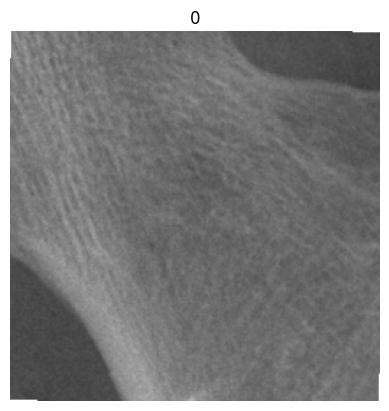

In [15]:
import matplotlib.pyplot as plt

data_point = combined_dataset[450]
tensor, _ = data_point
label_tensor = torch.tensor(0)  # 將標籤值設置為 tensor(0)

label = str(label_tensor.item())  # 將標籤 tensor 轉換為字串

image = tensor.permute(1, 2, 0)  # 將通道維度移到最後

plt.imshow(image)
plt.title(label)  # 設置標題為標籤值的字串形式
plt.axis('off')
plt.show()



In [16]:
import matplotlib.pyplot as plt

_, axes = plt.subplots(figsize=(256, 256), ncols=8, nrows=8)

for i, ax in enumerate(axes.flatten()):
    tensor, label = combined_dataset[i]
    image = tensor.permute(1, 2, 0)  # 將通道維度移到最後
    ax.imshow(image)
    ax.set_title(label)  # 設置標題為標籤值
    ax.axis('off')

plt.show()




In [17]:
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision
from torchvision import transforms
from collections import OrderedDict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torch
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader



In [18]:
count_osteoporosis = 0
count_osteopenia = 0

for _,  label in combined_dataset:
    if label.item() == 1:  # 將 Tensor 轉換為整數值進行比較
        count_osteoporosis += 1
    elif label.item() == 0:
        count_osteopenia += 1

print(f"Total number of samples in osteoporosis class: {count_osteoporosis}")
print(f"Total number of samples in osteopenia class: {count_osteopenia}")

Total number of samples in osteoporosis class: 278
Total number of samples in osteopenia class: 328


In [25]:
import random

# 計算兩個類別的數量
count_osteoporosis = 278
count_osteopenia = 328

# 決定從 "osteopenia" 類別中隨機選取多少樣本
num_samples_to_keep = count_osteoporosis

# 進行隨機欠採樣，將 "osteopenia" 類別的樣本數量減少到與 "osteoporosis" 相同
under_sampling_dataset = []
num_samples_kept = 0

for sample, label in combined_dataset:
    if label.item() == 0:  # "osteopenia" 類別
        if num_samples_kept < num_samples_to_keep:
            under_sampling_dataset.append((sample,label))
            num_samples_kept += 1
        else:
            # 跳過額外的 "osteopenia" 樣本
            continue
    else:  # "osteoporosis" 類別
        under_sampling_dataset.append((sample, label))

# 將平衡後的資料集重新轉換為 DataLoader
#train_loader = DataLoader(train_dataset_balanced, batch_size=batch_size, shuffle=True)

In [26]:
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

batch_size = 5
k = 5  # 折叠数
kfold = KFold(n_splits=k, shuffle=True)

for fold, (train_indices, _) in enumerate(kfold.split(under_sampling_dataset)):
    print(f"Fold {fold+1}/{k}")
    print("-" * 10)

    # 获取当前折叠的训练集和验证集的样本索引
    train_indices, val_indices = train_test_split(train_indices, test_size=0.1, random_state=32)

    # 根据索引创建训练集和验证集的子集
    train_subset = torch.utils.data.Subset(under_sampling_dataset, train_indices)
    val_subset = torch.utils.data.Subset(under_sampling_dataset, val_indices)

    # 创建训练集和验证集的数据加载器
    train_loader = torch.utils.data.DataLoader(train_subset, batch_size=batch_size, shuffle=True)
    test_loader = torch.utils.data.DataLoader(val_subset, batch_size=batch_size, shuffle=False)

Fold 1/5
----------
Fold 2/5
----------
Fold 3/5
----------
Fold 4/5
----------
Fold 5/5
----------


In [27]:
count_osteoporosis = 0
count_osteopenia = 0

for _, label in under_sampling_dataset:
    if label.item() == 1:  # 將 Tensor 轉換為整數值進行比較
        count_osteoporosis += 1
    elif label.item() == 0:
        count_osteopenia += 1

print(f"Total number of samples in osteoporosis class: {count_osteoporosis}")
print(f"Total number of samples in osteopenia class: {count_osteopenia}")

Total number of samples in osteoporosis class: 278
Total number of samples in osteopenia class: 278


In [28]:
#batch_size = 5
# Create data loaders
#train_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)
#test_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)


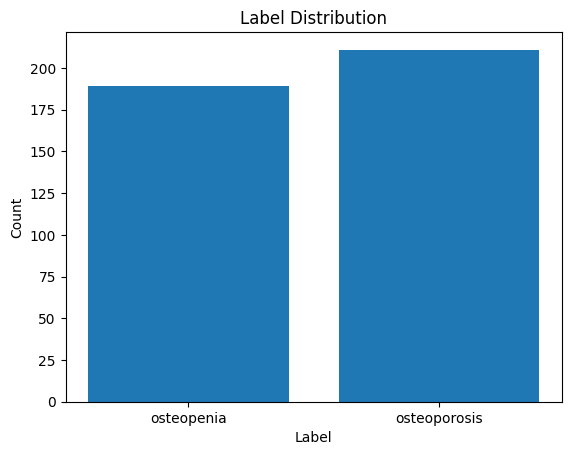

In [30]:
import matplotlib.pyplot as plt

# 統計每個類別的樣本數量
label_counts = {}

for _, labels in train_loader:
    for label in labels:
        label = label.item()
        if label in label_counts:
            label_counts[label] += 1
        else:
            label_counts[label] = 1

# 提取類別標籤和對應的樣本數量
labels = list(label_counts.keys())
counts = list(label_counts.values())

# 定義類別標籤的名稱
label_names = ['osteopenia', 'osteoporosis']  # 假設兩個類別分別為"osteopenia"和"osteoporosis"

# 設置x軸的標籤為類別名稱
plt.xticks(labels, label_names)

# 繪製柱狀圖
plt.bar(labels, counts)
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Label Distribution')
plt.show()


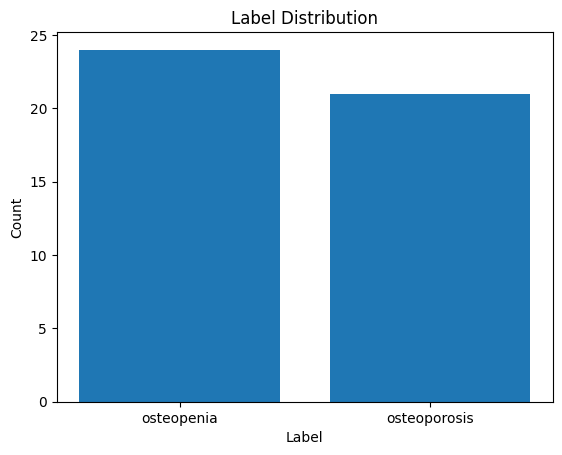

In [31]:
import matplotlib.pyplot as plt

# 統計每個類別的樣本數量
label_counts = {}

for _, labels in test_loader:
    for label in labels:
        label = label.item()
        if label in label_counts:
            label_counts[label] += 1
        else:
            label_counts[label] = 1

# 提取類別標籤和對應的樣本數量
labels = list(label_counts.keys())
counts = list(label_counts.values())

# 定義類別標籤的名稱
label_names = ['osteopenia', 'osteoporosis']  # 假設兩個類別分別為"osteopenia"和"osteoporosis"

# 設置x軸的標籤為類別名稱
plt.xticks(labels, label_names)

# 繪製柱狀圖
plt.bar(labels, counts)
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Label Distribution')
plt.show()

In [32]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda")
    print("GPU可用")
else:
    device = torch.device("cpu")
    print("GPU不可用")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


GPU可用


In [40]:
model = models.resnet34(pretrained=True)
input_channels = model.conv1.in_channels
model.conv1 = nn.Conv2d(4, model.conv1.out_channels,
                        kernel_size=model.conv1.kernel_size,
                        stride=model.conv1.stride,
                        padding=model.conv1.padding,
                        bias=model.conv1.bias)

model = model.to(device)
# 将模型的最后一层替换为适合你的任务的新的全连接层
num_classes = 2  # 根据你的任务设置类别数
model.fc = nn.Linear(model.fc.in_features, num_classes, nn.Sigmoid())

# 加载保存的模型参数
#checkpoint_path = "/Users/USER/OneDrive/桌面/TESTING_DATA//model.pth"
#model.load_state_dict(torch.load(checkpoint_path))

# 将模型设置为评估模式
#model.eval()

# 2. 定义损失函数
criterion = nn.CrossEntropyLoss()

# 3. 定义优化器
optimizer = optim.SGD(model.parameters(), lr=0.0001, momentum=0.9)

# 4. 设置学习率调度器（可选）
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)



In [41]:
model

ResNet(
  (conv1): Conv2d(4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Epoch 1/100
----------
Train Loss: 0.7023 Acc: 0.5575
Val Loss: 0.6966 Acc: 0.5333

Epoch 2/100
----------
Train Loss: 0.6831 Acc: 0.5775
Val Loss: 0.6473 Acc: 0.5778

Epoch 3/100
----------
Train Loss: 0.6522 Acc: 0.6225
Val Loss: 0.7126 Acc: 0.5778

Epoch 4/100
----------
Train Loss: 0.6477 Acc: 0.6475
Val Loss: 0.6854 Acc: 0.5333

Epoch 5/100
----------
Train Loss: 0.5782 Acc: 0.7175
Val Loss: 0.6330 Acc: 0.6222

Epoch 6/100
----------
Train Loss: 0.5769 Acc: 0.6775
Val Loss: 0.6175 Acc: 0.6889

Epoch 7/100
----------
Train Loss: 0.5404 Acc: 0.7550
Val Loss: 0.5820 Acc: 0.6667

Epoch 8/100
----------
Train Loss: 0.4999 Acc: 0.7850
Val Loss: 0.5343 Acc: 0.7778

Epoch 9/100
----------
Train Loss: 0.4983 Acc: 0.7975
Val Loss: 0.5326 Acc: 0.8000

Epoch 10/100
----------
Train Loss: 0.4786 Acc: 0.8075
Val Loss: 0.5403 Acc: 0.7778

Epoch 11/100
----------
Train Loss: 0.4921 Acc: 0.7900
Val Loss: 0.5385 Acc: 0.7556

Epoch 12/100
----------
Train Loss: 0.4819 Acc: 0.7900
Val Loss: 0.5415 Ac

Train Loss: 0.4367 Acc: 0.8475
Val Loss: 0.5249 Acc: 0.7111

Epoch 99/100
----------
Train Loss: 0.4454 Acc: 0.8075
Val Loss: 0.5254 Acc: 0.7778

Epoch 100/100
----------
Train Loss: 0.4594 Acc: 0.8200
Val Loss: 0.5431 Acc: 0.7111



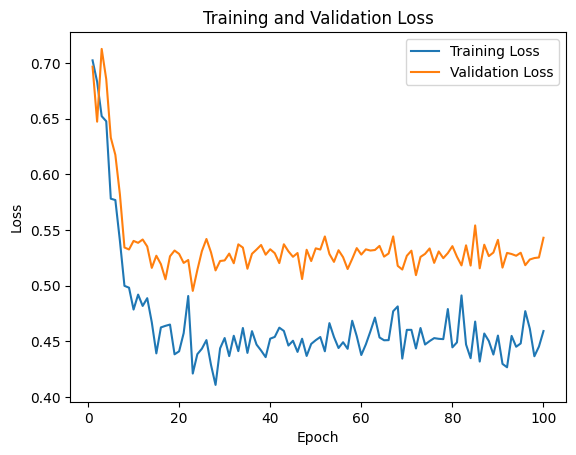

In [42]:
import matplotlib.pyplot as plt

def train_model(model, criterion, optimizer, scheduler, num_epochs):
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print("-" * 10)

        # 训练阶段
        model.train()
        train_loss = 0.0
        train_corrects = 0

        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            model = model.to(device)

            optimizer.zero_grad()

            # 前向传播
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # 计算损失
            loss = criterion(outputs, labels)

            # 反向传播和参数更新
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * inputs.size(0)
            train_corrects += torch.sum(preds == labels.data)

        train_loss = train_loss / len(train_loader.dataset)
        train_acc = train_corrects.double() / len(train_loader.dataset)

        print(f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f}")
        train_losses.append(train_loss)

        # 验证阶段
        model.eval()
        val_loss = 0.0
        val_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # 前向传播
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)

                # 计算损失
                loss = criterion(outputs, labels)

                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(preds == labels.data)

        val_loss = val_loss / len(test_loader.dataset)
        val_acc = val_corrects.double() / len(test_loader.dataset)

        print(f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")
        val_losses.append(val_loss)

        print()

        # 学习率调度器更新
        scheduler.step()

    # 绘制训练损失和验证损失的折线图
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

    return model

# 调用训练函数
num_epochs = 100
model = train_model(model, criterion, optimizer, scheduler, num_epochs)


In [43]:
from sklearn.metrics import mean_squared_error
# 在验证集上进行预测
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 前向传播
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# 计算均方误差
mse = mean_squared_error(y_true, y_pred)

print(f"MSE: {mse:.4f}")

MSE: 0.2889


In [44]:
from sklearn.metrics import confusion_matrix

# 在验证集上进行预测
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 前向传播
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# 计算混淆矩阵
cm = confusion_matrix(y_true, y_pred)

print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[20  4]
 [ 9 12]]


In [45]:
from sklearn.metrics import classification_report

# 在验证集上进行预测
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 前向传播
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# 生成性能报告
report = classification_report(y_true, y_pred)

print("Performance Metrics:")
print(report)

Performance Metrics:
              precision    recall  f1-score   support

           0       0.69      0.83      0.75        24
           1       0.75      0.57      0.65        21

    accuracy                           0.71        45
   macro avg       0.72      0.70      0.70        45
weighted avg       0.72      0.71      0.71        45



In [ ]:
# 定义保存路径
save_path = "model.pth"
# 保存模型参数
torch.save(model.state_dict(), save_path)

#print("Model parameters saved successfully.")